
# پروژه پایانی درس سیگنال ها و سیستم ها
## تغییر صدا
در این پروژه به پیاده سازی سیستم زمان گسسته برای تغییر صدا پرداخته میشود
از کاربردهای تبدیل صدا و تغییر پیچ صدا میتوان به نرم افزارهای متن به گفتار و تشخیص و اهراز هویت صدا اشخاص و همچنین تغییر صدا برای مجهول ماندن گوینده آن اشاره کرد



In [1]:
from scipy.io import wavfile as wav
from scipy.fftpack import fft
from pydub import AudioSegment
from pydub.playback import play
from playsound import playsound
from scipy.io.wavfile import write
import pyaudio
import wave
import numpy as np
import scipy.signal as sp
import IPython
import matplotlib.pyplot as plt


/usr/local/lib/python3.7/site-packages/pydub/utils.py:165: RuntimeWarning: Couldn't find ffmpeg or avconv - defaulting to ffmpeg, but may not work
  warn("Couldn't find ffmpeg or avconv - defaulting to ffmpeg, but may not work", RuntimeWarning)
/usr/local/lib/python3.7/site-packages/pydub/utils.py:179: RuntimeWarning: Couldn't find ffplay or avplay - defaulting to ffplay, but may not work
  warn("Couldn't find ffplay or avplay - defaulting to ffplay, but may not work", RuntimeWarning)


یک تابع پیاده سازی می کنیم، جهت رسم تبدیل فوریه ی سیگنال

In [9]:
def draw(voice):
    voice_fft = fft(voice)
    voice_fft = voice_fft[0:len(voice_fft)//2]
    plt.plot(voice_fft)


کانفیگ های ضبط صدا در سکشن زیر آمده است

In [10]:
FORMAT = pyaudio.paInt16  # format of sampling 16 bit int
CHANNELS = 1  # number of channels it means number of sample in every sampling
RATE = 44100  # number of sample in 1 second sampling
CHUNK = 1024  # length of every chunk
RECORD_SECONDS = 10  # time of recording in seconds
WAVE_OUTPUT_FILENAME = "file.wav"  # file name

با استفاده از ماژول (پای آدیو) یک استریم می سازیم و به اندازه ی یک چانک از آن بافر میکنیم و آن را در فریم ذخیره می کنیم

سپس آن فریم را در فایل ویو ذخیره می کنیم

In [11]:
audio = pyaudio.PyAudio()


print("recording...")
stream = audio.open(
    format=FORMAT,
    channels=CHANNELS,
    rate=RATE,
    input=True,
    frames_per_buffer=CHUNK
)
# start Recording

frames = []
for i in range(0, int(RATE / CHUNK * RECORD_SECONDS)):
    data = stream.read(CHUNK)
    frames.append(data)

# stop Recording
stream.stop_stream()
stream.close()

# storing voice
waveFile = wave.open(WAVE_OUTPUT_FILENAME, 'wb')
waveFile.setnchannels(CHANNELS)
waveFile.setsampwidth(audio.get_sample_size(FORMAT))
waveFile.setframerate(RATE)
waveFile.writeframes(b''.join(frames))
waveFile.close()
print('finish.')

recording...
finish.


# حالت ساده

فایل ویو ضبط شده را بخش می کند

In [12]:
# reading voice
rate, data = wav.read('file.wav')
print('sampling rate : ', rate)
IPython.display.Audio(data, rate=rate)


sampling rate :  44100


با استفاده از تابع (دراو) تبدیل فوریه ی صوت ضبط شده را رسم می کنیم

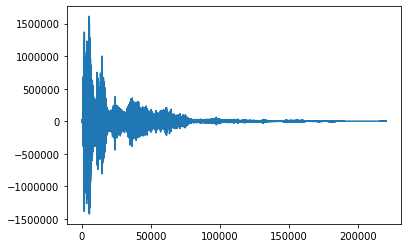

In [13]:
draw(data)

بدلیل اینکه بتوانیم سیستم را بصورت ریل-تایم نیز پیاده سازی کنیم، بجای شیفت در حوزه ی فرکانس و گرفتن تبدیل فوریه معکوس (که نیازمند داشتن تمام سیگنال می باشد) از ضرب در تابع اویلری در سیگنال در حوزه ی زمان استفاده می کنیم.
که با توجه به حقیقی بودن سیگنال تابع اویلی برابر با همان تابع کسینوس می شود
$$
    y[n] = x[n] \, \cos(\omega_0 n)
$$
که نتیجتا موجب شیفت یافتن سیگنال در حوزه ی فرکانس می شود و باعث می شود صدا بم تر یا زیر تر شود.

In [14]:
w =  2 * np.pi * 400 / rate
out = data * np.cos(w * np.arange(0,len(data)))

IPython.display.Audio(out, rate=rate)

سیگنال جدید (شیفت یافته) را رسم میکنیم و میبینیم که شیفت یافته است

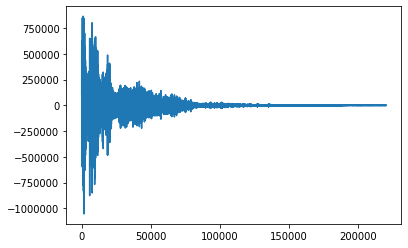

In [15]:
draw(out)

مشابه قبل با مقادیر دیگری نیز شیفت می دهیم و میبینیم که صدا هربار مجددا متفاوت می شود

In [16]:
w =  2 * np.pi * 700 / rate
out = data * np.cos(w * np.arange(0,len(data)))

IPython.display.Audio(out, rate=rate)

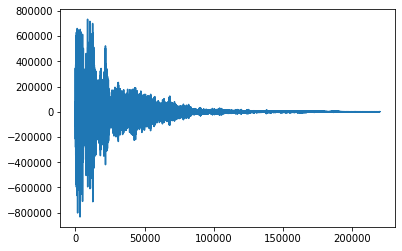

In [17]:
draw(out)

In [18]:
w =  2 * np.pi * 900 / rate
out = data * np.cos(w * np.arange(0,len(data)))

IPython.display.Audio(out, rate=rate)

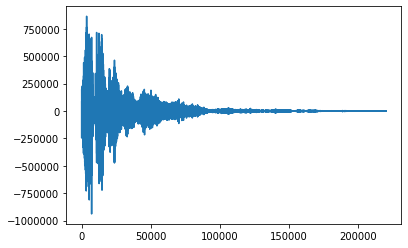

In [19]:
draw(out)

In [42]:
RECORD_SECONDS_realtime = 3  # time of recording in seconds
CHUNK = 1024 # length of every chunk
WAVE_OUTPUT_FILENAME_realtime = "file_realtim.wav"  # file name

# real time is disabled because it doesn't get out of this loop unless with a keyboard interrupt
# and it generates an error showing that interupt
# if you want to run the realtime change the condition of while to "True" in the snippet below


while False:
    stream = audio.open(
        format=FORMAT,
        channels=CHANNELS,
        rate=RATE,
        input=True,
        frames_per_buffer=CHUNK
    )

    # start Recording

    frames = []
    print("recording...")
    for i in range(0, int(RATE / CHUNK * RECORD_SECONDS_realtime)):
        

        data_realtime = stream.read(CHUNK)
        
        frames.append(data_realtime)
    print("play...")


    # stop Recording
    stream.stop_stream()
    stream.close()

    # storing voice
    waveFile = wave.open(WAVE_OUTPUT_FILENAME_realtime, 'wb')
    waveFile.setnchannels(CHANNELS)
    waveFile.setsampwidth(audio.get_sample_size(FORMAT))
    waveFile.setframerate(RATE)
    waveFile.writeframes(b''.join(frames))
    waveFile.close()
    
    
    rate_realtime, data_realtime = wav.read('file_realtim.wav')
    wreal =  2 * np.pi * 400 / rate_realtime
    outreal = data_realtime * np.cos(wreal * np.arange(0,len(data_realtime)))
    write('out_realtime.wav', 44100, outreal)
    playsound('out_realtime.wav')

# حالت پیشرفته
برای تغییر یک صدا به صدای دیگر لازم است که پیچ های دو سیگنال را باهم جابجا کنیم (پیچ سیگنال هدف را به جای پیچ سیگنال اولیه قرار می دهیم) که برای این کار نیاز به یک تابع برای یافتن پیچ ها و یک تابع برای تغییر پیچ ها داریم.
برای این کار ابتدا پیچ های هر دو صدا را می یابیم و سپس پیچ سیگنال اولیه را به اندازه ی اختلاف پیچش با پیچ سیگنال هدف شیفت می دهیم 

پیچ درواقع درک انسان از زیر و بمی صداست که با فرکانس متفاوت است و به همین دلیل است که با تغییر فرکانس خالی لزوما صدا تبدیل به صدای هدف نمی شود

پیچ تابعی از فرکانس و تراز صدا می باشد

درواقع آوا ها و صدا ها و نت های موسیقی که گوش انسان آن ها را تشخیص می دهد دارای یک ساختار متناوب (پریودیک) در حوزه ی فرکانس می باشند

برای تغییر پیچ ها این کار را در حوزه ی فرکانسی انجام میدهیم

برای تابع شیفت پیچ از الگوریتم (دی اف تی)‌استفاده مینماییم

بر روی تبدیل فوریه ی سیگنال از چپ به راست، اولین پیک را پیک اساسی (فاندیمنتال) می نامیم و بقیه را پیک های جزیی (پارشیال) می نامیم

این کار را در واقع بر روی هر نت یا آوا جداگانه انجام می دهیم

سپس هر کدام را جداگانه پیچ می دهیم و حاصل آن ها می شود صدای پیچ یافته

برای گرفتن این آواها از یک صوت، آن را به قسمت های کوچک تقسیم می کنیم که این قسمت ها باید به شکلی باشند که نه آنقدر کوچک باشند که آوا ناقص شود و تبدیل فوریه ی ما خراب شود و نه آنقدر بزرگ باشند که بیش از یک آوا ضبط شود که اصولا بین ۵۰ تا ۱۰۰ میلی ثانیه می باشد 

اگر مشابه روش قبل عمل کرده و صرفا فرکانس ها را جابجا کنیم بدلیل بهم ریختن هارمونی سیگنال صدا حالت غیر واقعی پیدا می کند ( چرا که آوا های ایجاد شده توسط انسان و ساز ها همگی هارمونیک هستند) اما در این روش چون ابتدا آوا ها را از هم جدا می کنیم و هرکدام را جداگانه پیچ می کنیم حالت هارمونیک آن ها حفظ می شود و صدا حالت واقعی پیدا می کند

سیگنال صوتی صحبت انسان هارمونیک نیست بهمین دلیل سیگنال صوتی انسان را بخش بخش می کنیم (روی آن پنجره گذاری می کنیم) تا آوا ها که هارمونیک هستند را بدست بیاوریم

برای درست پیچ کردن باید هر سگمنت از سیگنال را در حوزه ی فرکانس در امتداد محور فرکانس به اندازه ی بازه ی سیگنال اصلی گسترش دهیم تا پس از تغییر پیچ همچنان هارمونیک باقی بماند 

In [22]:
def DFT_rescale(x, f):
    X = np.fft.fft(x)
    # separate even and odd lengths
    parity = (len(X) % 2 == 0)
    N = int(len(X) / 2) + 1 if parity else (len(X) + 1) / 2
    Y = np.zeros(N, dtype=np.complex)
    # work only in the first half of the DFT vector since input is real
    for n in range(0, N):
        # accumulate original frequency bins into rescaled bins
        ix = int(n * f)
        if ix < N:
            Y[ix] += X[n]
    # now rebuild a Hermitian-symmetric DFT
    Y = np.r_[Y, np.conj(Y[-2:0:-1])] if parity else np.r_[Y, np.conj(Y[-1:0:-1])]
    return np.real(np.fft.ifft(Y))

In [23]:
# converting milliseconds to samples
def ms2smp(ms, Fs):
    return int(float(Fs) * float(ms) / 1000.0)

In [24]:
# trapezoid window
def win_taper(N, a):
    R = int(N * a / 2)
    r = np.arange(0, R) / float(R)
    win = np.r_[r, np.ones(N - 2*R), r[::-1]]
    stride = N - R - 1
    return win, stride

حال پنجره هایی بر روی سیگنال تعریف می کنیم با استفاده از توابع بالا

حالا بر روی تمامی این پنجره ها تابع ری-اسکیل را فراخوانی می کنیم و آن ها را گسترش می دهیم و با در نظر گرفتن مقدار معینی به عنوان اور-لپ آن ها را با هم جمع می کنیم که سیگنال حاصل ما را نتیجه می دهند

دلیل این اور-لپ این است که پیوستگی بین آوا ها را پوشش دهیم

In [25]:
def DFT_pshift(x, f, G, overlap=0):
    N = len(x)
#     IPython.display.Audio(DFT_rescale(y, 1.4), rate=Fs_y)
    y = np.zeros(N)
    win, stride = win_taper(G, overlap)
    for n in range(0, len(x) - G, stride):
        w = DFT_rescale(x[n:n+G] * win, f)
        y[n:n+G] += w * win
    return y

نتیجه ی پیچ شده ی فایل صوتی توسط مکانیزم بالا را با دو مقدار متفاوت امتحان می کنیم

* در فرکانس های بالا تر بدلیل گسترده تر بودن سیگنال در حوزه فرکانس از اور-لپ بیشتر استفاده می کنیم

In [26]:
IPython.display.Audio(DFT_pshift(data, 1.5, ms2smp(40, rate), 0.4), rate=rate)

In [27]:
IPython.display.Audio(DFT_pshift(data, 0.6, ms2smp(40, rate), 0.2), rate=rate)

حال فایل صوتی هدف را ضبط می کنیم

In [28]:
WAVE_OUTPUT_FILENAME_TARGET = "fileTarget.wav"  # file name
audio = pyaudio.PyAudio()


print("recording...")
stream = audio.open(
    format=FORMAT,
    channels=CHANNELS,
    rate=RATE,
    input=True,
    frames_per_buffer=CHUNK
)
# start Recording

frames = []
for i in range(0, int(RATE / CHUNK * RECORD_SECONDS)):
    dataTarget = stream.read(CHUNK)
    frames.append(dataTarget)

# stop Recording
stream.stop_stream()
stream.close()

# storing voice
waveFile = wave.open(WAVE_OUTPUT_FILENAME_TARGET, 'wb')
waveFile.setnchannels(CHANNELS)
waveFile.setsampwidth(audio.get_sample_size(FORMAT))
waveFile.setframerate(RATE)
waveFile.writeframes(b''.join(frames))
waveFile.close()
print('finish.')

recording...
finish.


صوت هدف

In [29]:
# reading target voice
rateTarget, dataTarget = wav.read('fileTarget.wav')
print('sampling rate : ', rateTarget)
IPython.display.Audio(dataTarget, rate=rateTarget)



sampling rate :  44100


صوت مبدا

In [30]:
IPython.display.Audio(data, rate=rate)

با استفاده الگوریتم (وای ای ای پی تی) پیچ هر دو صوت را محاسبه میکنیم و میانگین پیچ آن ها را محاسبه می کنیم

In [31]:
import amfm_decompy.basic_tools as basic
import amfm_decompy.pYAAPT as pYAAPT

def YAAPT(Fn):
    # load audio
    signal = basic.SignalObj(Fn)
    filename = Fn
    # YAAPT pitches
    pitchY = pYAAPT.yaapt(signal, frame_length=40,
                      tda_frame_length=40, f0_min=75, f0_max=600)

#     print(pitchY.samp_values)

    # plot

    fig = plt.subplots(1, 1, sharex=True, sharey=True, figsize=(12, 8))
    plt.plot(pitchY.samp_values, label='YAAPT', color='blue')
    # plt.savefig('YAAPT.png')
    plt.show()
    return pitchY.samp_values


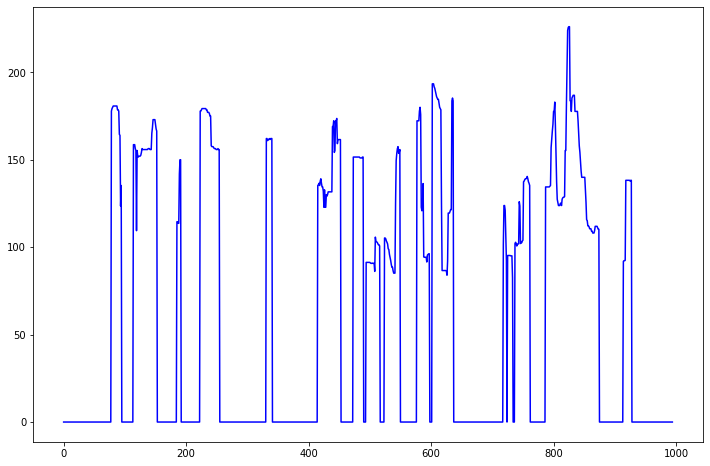

pitch:  [  0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.           0.         177.82258065 179.26829268
 180.         180.73770492 180.73770492 180.73770492 180

In [37]:
file_pitch = YAAPT('file.wav')
print('pitch: ',file_pitch)

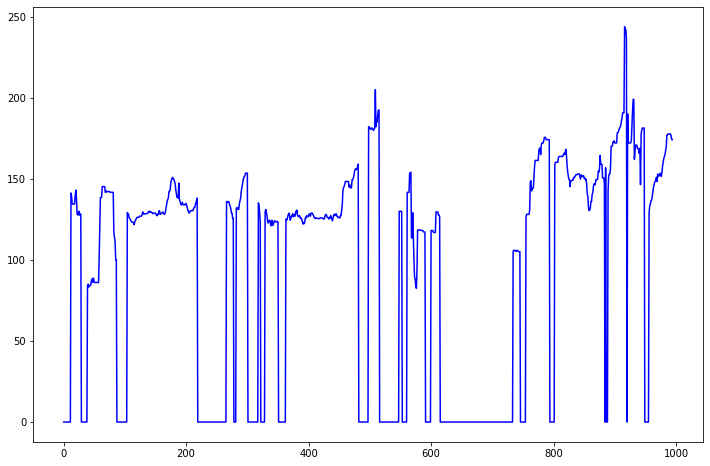

pitch:  [  0.           0.           0.           0.           0.
   0.           0.           0.           0.           0.
   0.           0.         141.34615385 139.11671924 134.86238532
 134.45121951 134.45121951 134.45121951 134.86238532 140.44585987
 143.18181818 137.8125     128.57142857 127.82608696 127.82608696
 130.08849558 127.82608696 128.57142857 128.19767442   0.
   0.           0.           0.           0.           0.
   0.           0.           0.           0.          83.84030418
  85.13513514  83.36483932  83.84030418  84.33837891  84.33837891
  86.1328125   88.2         86.1328125   88.73239437  88.73239437
  86.1328125   86.1328125   86.1328125   86.1328125   86.1328125
  86.1328125   86.1328125   86.1328125  100.48828125 118.76197525
 138.50074478 138.67924528 138.67924528 145.34912109 145.34912109
 145.34912109 145.34912109 145.34912109 141.80064309 141.80064309
 142.6574707  142.25806452 142.25806452 142.25806452 142.25806452
 142.25806452 141.80064309 141.8006

In [38]:
file_target_pitch = YAAPT('fileTarget.wav')
print('pitch: ',file_target_pitch)

سیگنال صوت مبدا را به مقدار نسبت پیچ سیگنال مبدا به هدف (پیچش را شیفت میدهیم) پیچ میکنیم

In [39]:

for i in range(len(file_pitch)):
    f1 = False
    if file_pitch[i]!=0.0 :
        for k in range(8):
            if file_pitch[i+k]==0.0:
                f1=True
        if not(f1):
            for j in range(i+1,len(file_pitch)):
                if int(file_pitch[j])==0:
                    a = j-i
                    break
            break
        
for i in range(len(file_target_pitch)):
    f2 = False
    if file_target_pitch[i]!=0.0:
        for k in range(8):
            if file_target_pitch[i+k]==0.0:
                f2=True
        if not(f2):
            for j in range(i+1,len(file_target_pitch)):
                if int(file_target_pitch[j])==0:
                    b = j-i
                    break
            break
        

p = a/b
print(p)

IPython.display.Audio(DFT_pshift(data, p, ms2smp(40, rate), 0.1), rate=rate)

1.0


In [43]:
RECORD_SECONDS_realtime = 3  # time of recording in seconds
CHUNK = 1024 # length of every chunk
WAVE_OUTPUT_FILENAME_realtime = "file_realtim.wav"  # file name

# real time is disabled because it doesn't get out of this loop unless with a keyboard interrupt
# and it generates an error showing that interupt
# if you want to run the realtime change the condition of while to "True" in the snippet below



while False:
    stream = audio.open(
        format=FORMAT,
        channels=CHANNELS,
        rate=RATE,
        input=True,
        frames_per_buffer=CHUNK
    )

    # start Recording

    frames = []
    print("recording...")
    for i in range(0, int(RATE / CHUNK * RECORD_SECONDS_realtime)):
        

        data_realtime = stream.read(CHUNK)
        
        frames.append(data_realtime)
    print("play...")


    # stop Recording
    stream.stop_stream()
    stream.close()

    # storing voice
    waveFile = wave.open(WAVE_OUTPUT_FILENAME_realtime, 'wb')
    waveFile.setnchannels(CHANNELS)
    waveFile.setsampwidth(audio.get_sample_size(FORMAT))
    waveFile.setframerate(RATE)
    waveFile.writeframes(b''.join(frames))
    waveFile.close()
    
    
    rate_realtime, data_realtime = wav.read('file_realtim.wav')
    out = DFT_pshift(data_realtime, p, ms2smp(40, rate_realtime), 0.1)
  
    write('out_realtime.wav', 44100, out)
    playsound('out_realtime.wav')